In [72]:
import pandas as pd

In [73]:
data = pd.read_csv("../data/curated/Combined Data.csv")
coast = pd.read_csv("../data/curated/vic_beach_proximity.csv")
schools = pd.read_csv("../data/curated/schools_by_SAL.csv")

In [74]:
# get years from 2016-2023
data_train = data[data['year'] != 2024]
# Perform an inner merge between data and schools on SAL_CODE
data_train = pd.merge(data_train, schools, on='SAL_CODE', how='inner')
data_train = pd.merge(data_train, coast, on='SAL_CODE', how='inner')

In [75]:
data_train[data_train['SAL_suburb'] == "Dandenong South"]['average_weekly_rent']

2920    318.75
2921    332.50
2922    344.00
2923    350.00
2924    350.00
2925    350.00
2926    359.25
2927    393.75
Name: average_weekly_rent, dtype: float64

In [76]:
data_train['Average_num_psns_per_bedroom']

0       0.90
1       0.88
2       0.86
3       0.84
4       0.82
        ... 
3419    0.84
3420    0.82
3421    0.80
3422    0.78
3423    0.76
Name: Average_num_psns_per_bedroom, Length: 3424, dtype: float64

In [77]:
data_train.shape

(3424, 68)

In [78]:
to_exclude = pd.read_csv('../data/landing/filtered_sal_codes.csv')

to_exclude = list(to_exclude['SAL_CODE'])

In [79]:
data_train.shape

(3424, 68)

In [80]:
excluded = ['Ravenhall','Quandong', 'Somerton','Tottenham','Dandenong South']

# also exclude any airport
data_train = data_train[~data_train['SAL_suburb'].str.contains('Airport')]

data_train = data_train[~data_train['SAL_CODE'].isin(to_exclude)]

In [81]:
data_train.shape

(2912, 68)

In [82]:
(3424 - 2912) / 4

128.0

In [83]:
data_train = data_train[data_train['SAL_suburb'].isin(excluded) == False]

In [84]:
data_train.columns

Index(['Suburb Cluster', 'SAL_suburb', 'SAL_CODE', 'Suburb Group',
       'AREASQKM21', 'station_count_in_suburb', 'closest_stations',
       'closest_station_1_STOP_NAME', 'closest_station_1_LATITUDE',
       'closest_station_1_LONGITUDE', 'closest_station_2_STOP_NAME',
       'closest_station_2_LATITUDE', 'closest_station_2_LONGITUDE',
       'suburb_centre_latitude', 'suburb_centre_longitude', 'distance_to_CBD',
       'time_to_CBD', 'distance_to_station', 'time_to_station', 'Cemeteries',
       'Civic squares and promenades', 'Conservation reserves',
       'Government schools', 'Natural and semi-natural open space',
       'Non-government schools', 'Parks and gardens',
       'Public housing reserves', 'Recreation corridor',
       'Services and utilities reserves',
       'Sportsfields and organised recreation', 'Tertiary institutions',
       'Transport reservations', 'year', 'A Crimes against the person',
       'Average_household_size', 'Average_num_psns_per_bedroom',
       '

In [85]:
# get top 15 rental values 
data_train.sort_values(by='average_weekly_rent', ascending=False).head(15)



,Suburb Cluster,SAL_suburb,SAL_CODE,Suburb Group,AREASQKM21,station_count_in_suburb,closest_stations,closest_station_1_STOP_NAME,closest_station_1_LATITUDE,closest_station_1_LONGITUDE,...,residential,shopping,internet_speed_test_count,inflation,2024_average_baths,2024_average_parking,2024_property_count,median_score,average_price,proximity_to_beach
3191,Southern Melbourne,Brighton East,20338,Brighton East,5.6665,0.0,"[{'STOP_NAME': 'North Brighton', 'LATITUDE': -...",North Brighton,-37.904887,145.002605,...,34.0,3.0,2571.0,7.0,NaN,NaN,NaN,31.730000,20529.000000,0.028061
3183,Southern Melbourne,Brighton,20337,Brighton,8.3701,4.0,"[{'STOP_NAME': 'Middle Brighton', 'LATITUDE': ...",Middle Brighton,-37.915134,144.996299,...,64.0,55.0,2486.0,7.0,NaN,NaN,NaN,34.213333,26083.500000,0.010829
3190,Southern Melbourne,Brighton East,20338,Brighton East,5.6665,0.0,"[{'STOP_NAME': 'North Brighton', 'LATITUDE': -...",North Brighton,-37.904887,145.002605,...,15.0,2.0,3125.0,5.1,NaN,NaN,NaN,31.730000,20529.000000,0.028061
3188,Southern Melbourne,Brighton East,20338,Brighton East,5.6665,0.0,"[{'STOP_NAME': 'North Brighton', 'LATITUDE': -...",North Brighton,-37.904887,145.002605,...,15.0,2.0,2121.0,2.2,NaN,NaN,NaN,31.730000,20529.000000,0.028061
3189,Southern Melbourne,Brighton East,20338,Brighton East,5.6665,0.0,"[{'STOP_NAME': 'North Brighton', 'LATITUDE': -...",North Brighton,-37.904887,145.002605,...,15.0,2.0,2740.0,1.1,NaN,NaN,NaN,31.730000,20529.000000,0.028061
3187,Southern Melbourne,Brighton East,20338,Brighton East,5.6665,0.0,"[{'STOP_NAME': 'North Brighton', 'LATITUDE': -...",North Brighton,-37.904887,145.002605,...,12.0,2.0,4641.0,1.3,NaN,NaN,NaN,31.730000,20529.000000,0.028061
3186,Southern Melbourne,Brighton East,20338,Brighton East,5.6665,0.0,"[{'STOP_NAME': 'North Brighton', 'LATITUDE': -...",North Brighton,-37.904887,145.002605,...,12.0,2.0,NaN,1.9,NaN,NaN,NaN,31.730000,20529.000000,0.028061
3180,Southern Melbourne,Brighton,20337,Brighton,8.3701,4.0,"[{'STOP_NAME': 'Middle Brighton', 'LATITUDE': ...",Middle Brighton,-37.915134,144.996299,...,36.0,19.0,2576.0,2.2,NaN,NaN,NaN,34.213333,26083.500000,0.010829
3182,Southern Melbourne,Brighton,20337,Brighton,8.3701,4.0,"[{'STOP_NAME': 'Middle Brighton', 'LATITUDE': ...",Middle Brighton,-37.915134,144.996299,...,36.0,19.0,3219.0,5.1,NaN,NaN,NaN,34.213333,26083.500000,0.010829
3295,Southern Melbourne,Hampton,21131,Hampton-Beaumaris,4.2443,1.0,"[{'STOP_NAME': 'Hampton', 'LATITUDE': -37.9379...",Hampton,-37.937977,145.001471,...,126.0,2.0,1618.0,7.0,NaN,NaN,NaN,28.728644,5461.359335,0.011042


In [86]:
cols = ['distance_to_CBD', 'time_to_CBD','distance_to_station', 'time_to_station', 'Cemeteries',
       'Civic squares and promenades', 'Conservation reserves',
       'Government schools', 'Natural and semi-natural open space',
       'Non-government schools', 'Parks and gardens',
       'Public housing reserves', 'Recreation corridor',
       'Services and utilities reserves',
       'Sportsfields and organised recreation', 'Tertiary institutions',
       'Transport reservations', 'year', 'A Crimes against the person',
       'Average_household_size', 'Average_num_psns_per_bedroom',
       'B Property and deception offences', 'C Drug offences',
       'D Public order and security offences', 'E Justice procedures offences',
       'F Other offences', 'Median_age_persons', 'Median_tot_fam_inc_weekly',
       'Median_tot_hhd_inc_weekly', 'Median_tot_prsnl_inc_weekly', 'Tot_P_P',
       'Total_dwelings', 'average_quarterly_count', 'average_weekly_rent',
       'avg_d_mbps_wt', 'commercial', 'education', 'food_establishments',
       'healthcare', 'industrial', 'public_transport', 'recreation',
       'residential', 'shopping', 'internet_speed_test_count', 'inflation',"SAL_CODE", "median_score", 'average_price',"proximity_to_beach"]

data_train = data_train[cols]

In [87]:
import pandas as pd

# Assuming your DataFrame is called df
# First, ensure that your DataFrame is sorted by 'year'
df = data_train
df = df.sort_values('year')

# Convert 'inflation' rates from percentages to decimals
df['inflation_decimal'] = df['inflation'] / 100

# Create a DataFrame containing all years from 2016 to the maximum year in your data
years = pd.DataFrame({'year': range(2016, df['year'].max() + 1)})

# Merge with the inflation data to ensure all years are included
inflation_data = pd.merge(years, df[['year', 'inflation_decimal']].drop_duplicates(), on='year', how='left')

# Forward-fill any missing inflation rates (if any years are missing)
inflation_data['inflation_decimal'] = inflation_data['inflation_decimal'].fillna(method='ffill')

# Calculate the cumulative inflation factor from 2016 to each year
inflation_data['cumulative_inflation_factor'] = (1 + inflation_data['inflation_decimal']).cumprod()

# Create a dictionary to map years to cumulative inflation factors
cumulative_inflation_dict = inflation_data.set_index('year')['cumulative_inflation_factor'].to_dict()

# Map the cumulative inflation factors back to the original DataFrame
df['cumulative_inflation_factor'] = df['year'].map(cumulative_inflation_dict)


# Update the 'inflation' column to reflect the cumulative effect from 2016
df['inflation'] = df['cumulative_inflation_factor']

# Drop the temporary columns if you no longer need them
df = df.drop(columns=['inflation_decimal', 'cumulative_inflation_factor'])


In [88]:
inflation_data

,year,inflation_decimal,cumulative_inflation_factor
0,2016,0.013,1.013000
1,2017,0.021,1.034273
2,2018,0.019,1.053924
3,2019,0.013,1.067625
4,2020,0.022,1.091113
5,2021,0.011,1.103115
6,2022,0.051,1.159374
7,2023,0.070,1.240530


In [89]:
df['inflation']

0       1.01300
1016    1.01300
2408    1.01300
280     1.01300
2000    1.01300
         ...   
295     1.24053
3047    1.24053
2239    1.24053
2367    1.24053
3423    1.24053
Name: inflation, Length: 2904, dtype: float64

In [90]:
# inflation affected columns
inflation_affected_cols = ['average_weekly_rent', 'Median_tot_fam_inc_weekly', 'Median_tot_hhd_inc_weekly', 'Median_tot_prsnl_inc_weekly']

# Apply inflation adjustment to the affected columns
for col in inflation_affected_cols:
    df[col + '/inflation'] = df[col] / df['inflation']

    df.drop(columns=[col], inplace=True)

In [91]:
df.drop(columns=['inflation'], inplace=True)

In [92]:
# divide by average_household_size to get 'per person' rent
df['average_weekly_rent/inflation/household_size'] = df['average_weekly_rent/inflation'] / df['Average_household_size']
df.drop(columns=['average_weekly_rent/inflation'], inplace=True)

In [93]:
#df.drop(columns=['Average_household_size'], inplace=True)

In [94]:
import numpy as np

In [95]:
# get crime rate per person
crime_cols = ['A Crimes against the person', 'B Property and deception offences', 'C Drug offences', 'D Public order and security offences', 'E Justice procedures offences', 'F Other offences']

for col in crime_cols:
    df[col + '/per_person'] = df[col] / df['Tot_P_P']

    df.drop(columns=[col], inplace=True)

In [96]:
# log data for every column but average weekly rent
for col in df.columns:
    if col not in ['average_weekly_rent/inflation/household_size', 'SAL_CODE', 'year']:
        df[col] = df[col].apply(lambda x: np.log(x + 1))

In [97]:
target = 'average_weekly_rent/inflation/household_size'

In [98]:
df.columns

Index(['distance_to_CBD', 'time_to_CBD', 'distance_to_station',
       'time_to_station', 'Cemeteries', 'Civic squares and promenades',
       'Conservation reserves', 'Government schools',
       'Natural and semi-natural open space', 'Non-government schools',
       'Parks and gardens', 'Public housing reserves', 'Recreation corridor',
       'Services and utilities reserves',
       'Sportsfields and organised recreation', 'Tertiary institutions',
       'Transport reservations', 'year', 'Average_household_size',
       'Average_num_psns_per_bedroom', 'Median_age_persons', 'Tot_P_P',
       'Total_dwelings', 'average_quarterly_count', 'avg_d_mbps_wt',
       'commercial', 'education', 'food_establishments', 'healthcare',
       'industrial', 'public_transport', 'recreation', 'residential',
       'shopping', 'internet_speed_test_count', 'SAL_CODE', 'median_score',
       'average_price', 'proximity_to_beach',
       'Median_tot_fam_inc_weekly/inflation',
       'Median_tot_hhd_inc_w

In [99]:
import matplotlib.pyplot as plt
import seaborn as sns

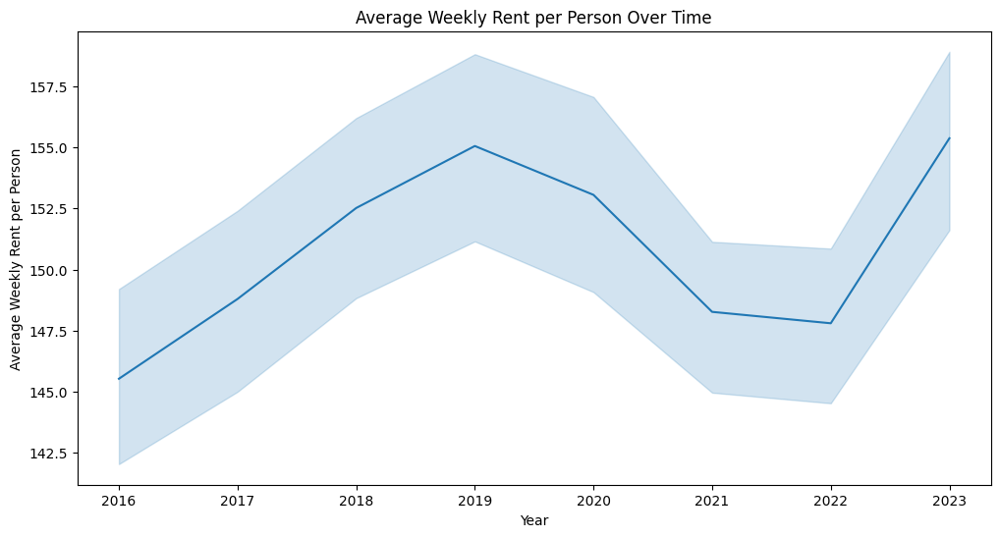

In [100]:
# plot target for each year to see if there are any trends
plt.figure(figsize=(12, 6))
sns.lineplot(x='year', y=target, data=df)
plt.title('Average Weekly Rent per Person Over Time')
plt.xlabel('Year')
plt.ylabel('Average Weekly Rent per Person')
plt.show()

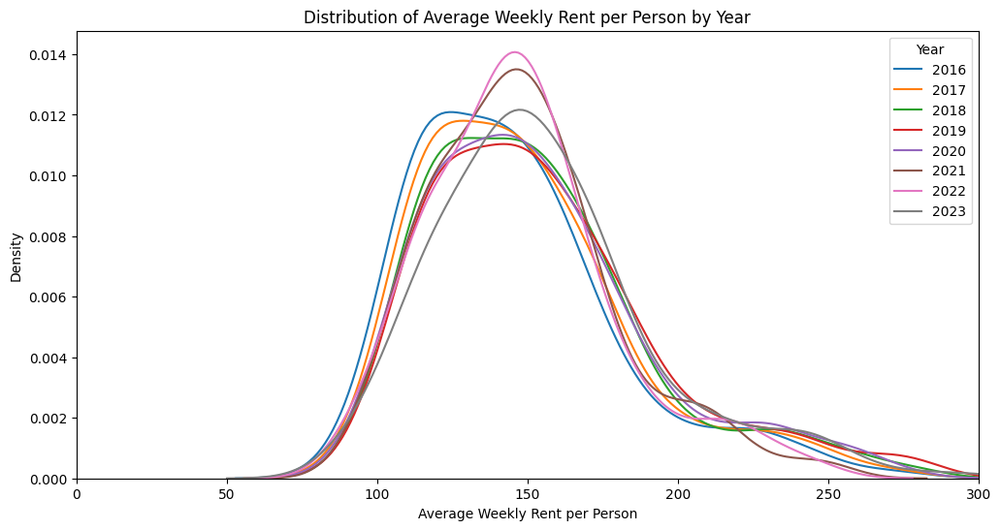

In [101]:
plt.figure(figsize=(12, 6))
for year in df['year'].unique():
    sns.kdeplot(df[df['year'] == year][target], label=year)

plt.title('Distribution of Average Weekly Rent per Person by Year')
plt.xlabel('Average Weekly Rent per Person')
plt.ylabel('Density')
plt.xlim(0, 300)
plt.legend(title='Year')
plt.show()


<Axes: xlabel='average_weekly_rent/inflation/household_size', ylabel='Count'>

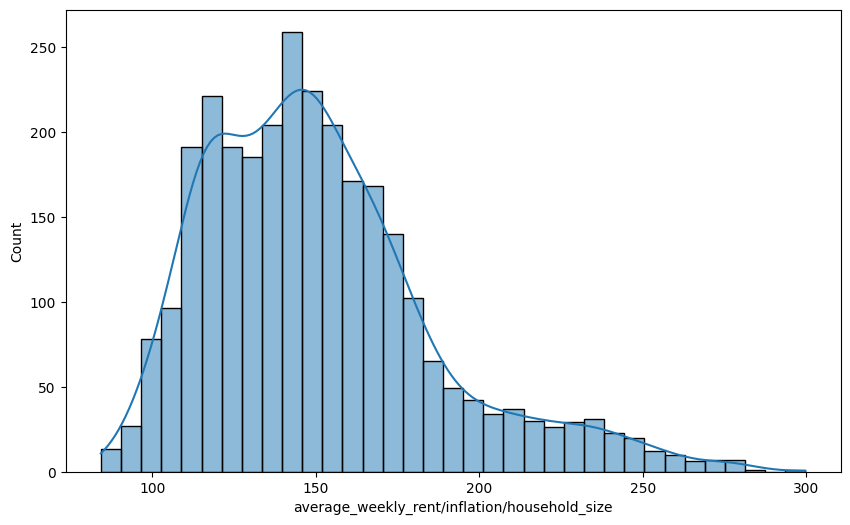

In [102]:
# Plot the distribution of the target variable
plt.figure(figsize=(10, 6))
sns.histplot(df[target], kde=True)

In [103]:
# drop speedtest
df.drop(columns=['avg_d_mbps_wt','internet_speed_test_count'], inplace=True)

In [104]:
df.dropna(inplace=True)

In [105]:
df.columns

Index(['distance_to_CBD', 'time_to_CBD', 'distance_to_station',
       'time_to_station', 'Cemeteries', 'Civic squares and promenades',
       'Conservation reserves', 'Government schools',
       'Natural and semi-natural open space', 'Non-government schools',
       'Parks and gardens', 'Public housing reserves', 'Recreation corridor',
       'Services and utilities reserves',
       'Sportsfields and organised recreation', 'Tertiary institutions',
       'Transport reservations', 'year', 'Average_household_size',
       'Average_num_psns_per_bedroom', 'Median_age_persons', 'Tot_P_P',
       'Total_dwelings', 'average_quarterly_count', 'commercial', 'education',
       'food_establishments', 'healthcare', 'industrial', 'public_transport',
       'recreation', 'residential', 'shopping', 'SAL_CODE', 'median_score',
       'average_price', 'proximity_to_beach',
       'Median_tot_fam_inc_weekly/inflation',
       'Median_tot_hhd_inc_weekly/inflation',
       'Median_tot_prsnl_inc_weekly

In [106]:
# remove Nan for target variable
df = df[~df[target].isna()]

In [107]:
max_value = df[target].max()
min_value = df[target].min()

print(f"Maximum value: {max_value}")
print(f"Minimum value: {min_value}")

# remove non numbers (infinity)
df = df[np.isfinite(df[target])]
df = df[~df[target].isna()]

Maximum value: 299.73911595351433
Minimum value: 84.24033790736551


In [108]:
df_dropped = df.drop(columns=['SAL_CODE', 'year', 'average_quarterly_count'])

In [109]:
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(df_dropped.drop(columns=[target]), df[target], test_size=0.2, random_state=42)

In [110]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler on the training data and transform both training and test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize the Linear Regression model
lr_model = LinearRegression()

# Train the model on the scaled training data
lr_model.fit(X_train_scaled, y_train)

# Make predictions on the scaled test set
y_pred_lr = lr_model.predict(X_test_scaled)

# Evaluate the model
mse_lr = mean_squared_error(y_test, y_pred_lr)
r2_lr = r2_score(y_test, y_pred_lr)

print(f"Linear Regression Mean Squared Error: {mse_lr}")
print(f"Linear Regression R^2 Score: {r2_lr}")

Linear Regression Mean Squared Error: 189.88108418095283
Linear Regression R^2 Score: 0.8357138500970804


In [111]:
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler on the training data and transform both training and test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize the Random Forest model
rf_model = RandomForestRegressor(random_state=42)

# Train the model on the scaled training data
rf_model.fit(X_train_scaled, y_train)

# Make predictions on the scaled test set
y_pred_rf = rf_model.predict(X_test_scaled)

# Evaluate the model
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest Mean Squared Error: {mse_rf}")
print(f"Random Forest R^2 Score: {r2_rf}")

Random Forest Mean Squared Error: 51.39452340878856
Random Forest R^2 Score: 0.9555331779711193


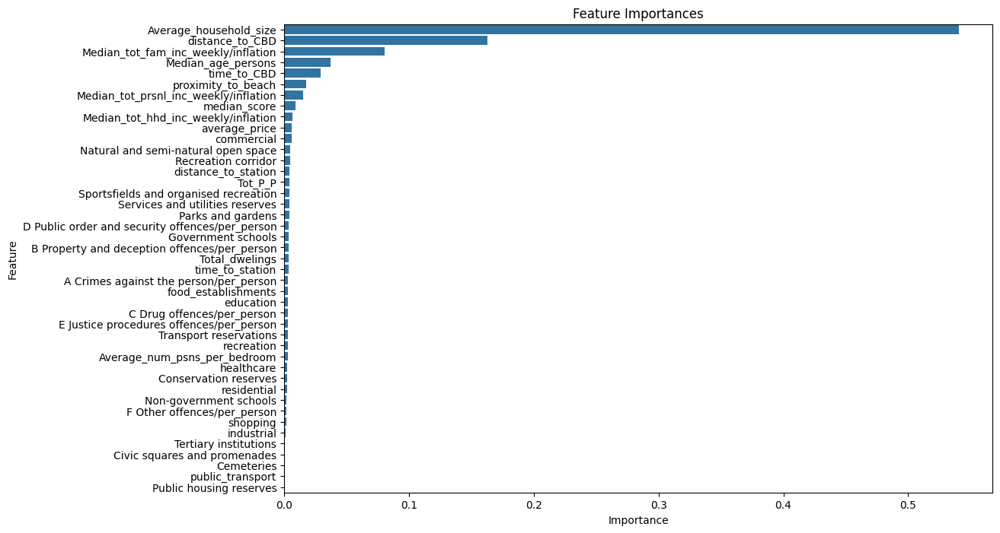

In [112]:
import seaborn as sns

import matplotlib.pyplot as plt

# Get feature importances from the RandomForest model
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=importances[indices], y=X_train.columns[indices])
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

In [113]:
from sklearn.model_selection import train_test_split
# Define features (X) and target (y)
X = df.drop(columns=[target, 'SAL_CODE'])
y = df[target]
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm

# Add a constant to the features (X) for the intercept term
X = sm.add_constant(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=4269)



# drop year
X_train.drop(columns=['year'], inplace=True)
X_test.drop(columns=['year'], inplace=True)


# Initialize and train the OLS model
model = sm.OLS(y_train, X_train).fit()

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")
print(model.summary())


Mean Squared Error: 188.78927612180794
R^2 Score: 0.8555263768220618
                                         OLS Regression Results                                         
Dep. Variable:     average_weekly_rent/inflation/household_size   R-squared:                       0.860
Model:                                                      OLS   Adj. R-squared:                  0.857
Method:                                           Least Squares   F-statistic:                     318.3
Date:                                          Wed, 25 Sep 2024   Prob (F-statistic):               0.00
Time:                                                  21:29:01   Log-Likelihood:                -9293.0
No. Observations:                                          2323   AIC:                         1.868e+04
Df Residuals:                                              2278   BIC:                         1.893e+04
Df Model:                                                    44                            

In [114]:
# top ten coeffs and name
# Get the coefficients from the model
coefficients = model.params

# Get the top 10 coefficient
top_10_coeffs = coefficients.nlargest(20)



# Print the top 10 coefficients and their names
print(top_10_coeffs)

D Public order and security offences/per_person    39261.509065
B Property and deception offences/per_person        8991.813466
A Crimes against the person/per_person              4906.887130
const                                                 61.467826
Median_tot_fam_inc_weekly/inflation                   47.731860
Average_num_psns_per_bedroom                          26.499179
median_score                                          18.812876
Median_age_persons                                    18.743177
Public housing reserves                               13.422916
Civic squares and promenades                           7.302906
Median_tot_hhd_inc_weekly/inflation                    5.946657
Tot_P_P                                                4.786668
time_to_station                                        4.492169
public_transport                                       2.371583
food_establishments                                    2.210408
Transport reservations                  

In [115]:
# Initialize and train the Random Forest model
from sklearn.ensemble import RandomForestRegressor


rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = rf_model.predict(X_test)

# Evaluate the model
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest Mean Squared Error: {mse_rf}")
print(f"Random Forest R^2 Score: {r2_rf}")

Random Forest Mean Squared Error: 56.07056829117728
Random Forest R^2 Score: 0.9570912166142013


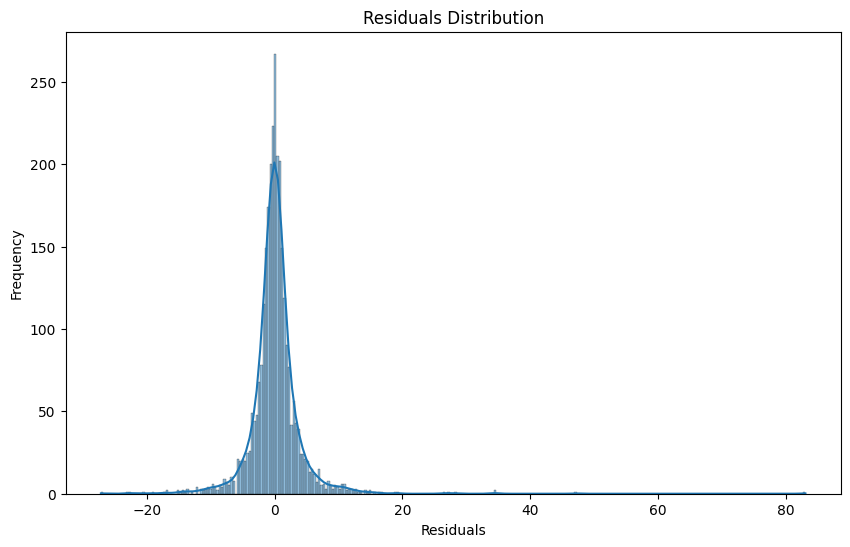

In [116]:
# plot residuals
# Calculate residuals
# Calculate residuals for the whole DataFrame
y_pred = rf_model.predict(X.drop(columns=['year']))
residuals = y - y_pred

# Plot residuals
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True)
plt.title('Residuals Distribution')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

In [117]:
residuals.shape

(2904,)

In [118]:
lg_residuals = y - model.predict(X.drop(columns=['year']))

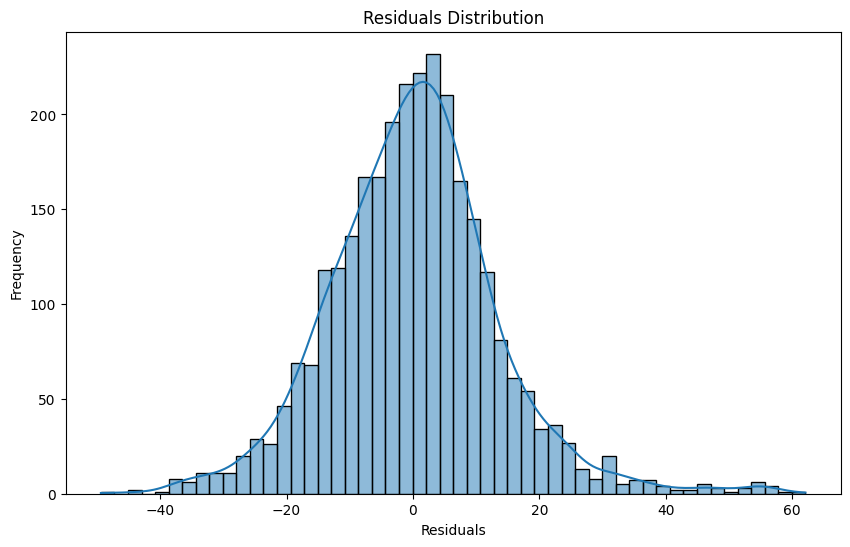

In [119]:
# Plot residuals
plt.figure(figsize=(10, 6))
sns.histplot(lg_residuals, kde=True)
plt.title('Residuals Distribution')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

In [120]:
# find SAL code of 10 highest residuals
residuals_df = pd.DataFrame({'SAL_CODE': df['SAL_CODE'], 'year': data_train['year'], 'residuals': residuals, "resduals_lg": lg_residuals, 'average_weekly_rent': df['average_weekly_rent/inflation/household_size']})

residuals_df



,SAL_CODE,year,residuals,resduals_lg,average_weekly_rent
0,20077,2016,4.106994,2.670429,154.457569
1,20077,2017,5.225118,3.487544,157.199120
2,20077,2018,5.588102,5.674339,160.489112
3,20077,2019,3.218083,4.004111,163.255583
4,20077,2020,1.482270,1.435453,160.386694
...,...,...,...,...,...
3419,22720,2019,-0.060943,-5.387703,117.428684
3420,22720,2020,0.693631,-4.861486,119.363921
3421,22720,2021,0.382422,-11.312714,118.466157
3422,22720,2022,-0.993575,-11.595569,118.400042


In [121]:
import geopandas as gpd

In [122]:
# import SAL
sal_code = gpd.read_file("../data/landing/SAL_data/SAL_2021_AUST_GDA2020.shp")

# Drop non-integer SAL_CODE21 values
sal_code = sal_code[sal_code['SAL_CODE21'].apply(lambda x: str(x).isdigit())]
sal_code["SAL_CODE21"] = sal_code["SAL_CODE21"].astype(int)

In [123]:
# residuals_df 
residuals_df = residuals_df.merge(sal_code, right_on='SAL_CODE21', left_on='SAL_CODE')

In [124]:
residuals_df.columns

Index(['SAL_CODE', 'year', 'residuals', 'resduals_lg', 'average_weekly_rent',
       'SAL_CODE21', 'SAL_NAME21', 'STE_CODE21', 'STE_NAME21', 'AUS_CODE21',
       'AUS_NAME21', 'AREASQKM21', 'LOCI_URI21', 'SHAPE_Leng', 'SHAPE_Area',
       'geometry'],
      dtype='object')

In [125]:
from math import radians, cos, sin, asin, sqrt

# for better visualisaiton, remove suburbs too far outside melbourne
# Compute distance to Melbourne CBD
melbourne_cbd_coords = (-37.8136, 144.9631)  # Latitude and Longitude of Melbourne CBD

# Function to calculate distance
def haversine(lat1, lon1, lat2, lon2):
    # convert decimal degrees to radians
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    # haversine formula
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371  # Radius of earth in kilometers
    return c * r

# Apply the function to calculate distance to Melbourne CBD
residuals_df['distance_to_CBD'] = residuals_df.apply(lambda row: haversine(row['geometry'].centroid.y, row['geometry'].centroid.x, melbourne_cbd_coords[0], melbourne_cbd_coords[1]), axis=1)

# Filter out suburbs too far outside Melbourne (e.g., more than 50 km)
residuals_df = residuals_df[residuals_df['distance_to_CBD'] <= 100]

In [126]:
# look at 2023 residuals

year = [2023]

residuals_2023 = residuals_df[residuals_df["year"] == 2023]

# now make gdf

residuals_2023 = gpd.GeoDataFrame(residuals_2023, geometry='geometry')

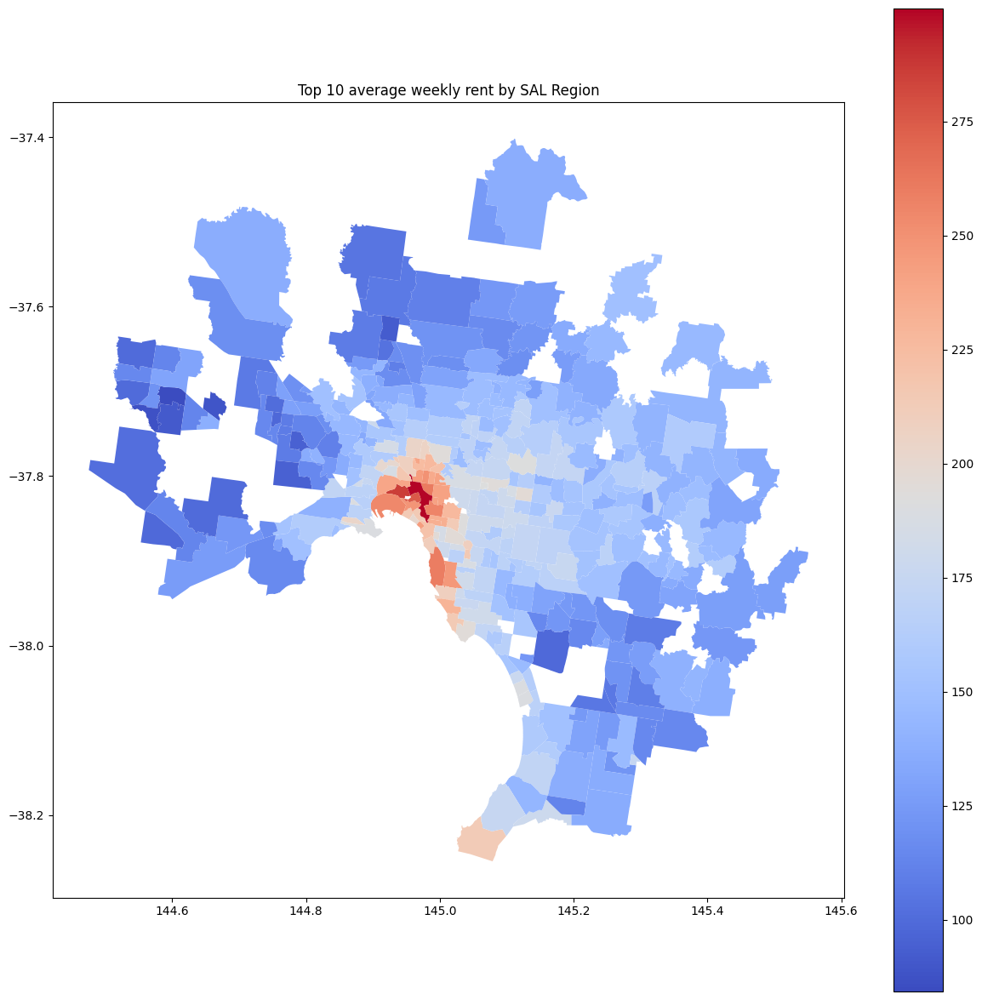

In [127]:
# graph top 10 residuals
fig, ax = plt.subplots(figsize=(15, 15))
residuals_2023.plot(column='average_weekly_rent', ax=ax, legend=True, cmap='coolwarm')
plt.title('Top 10 average weekly rent by SAL Region')
plt.show()

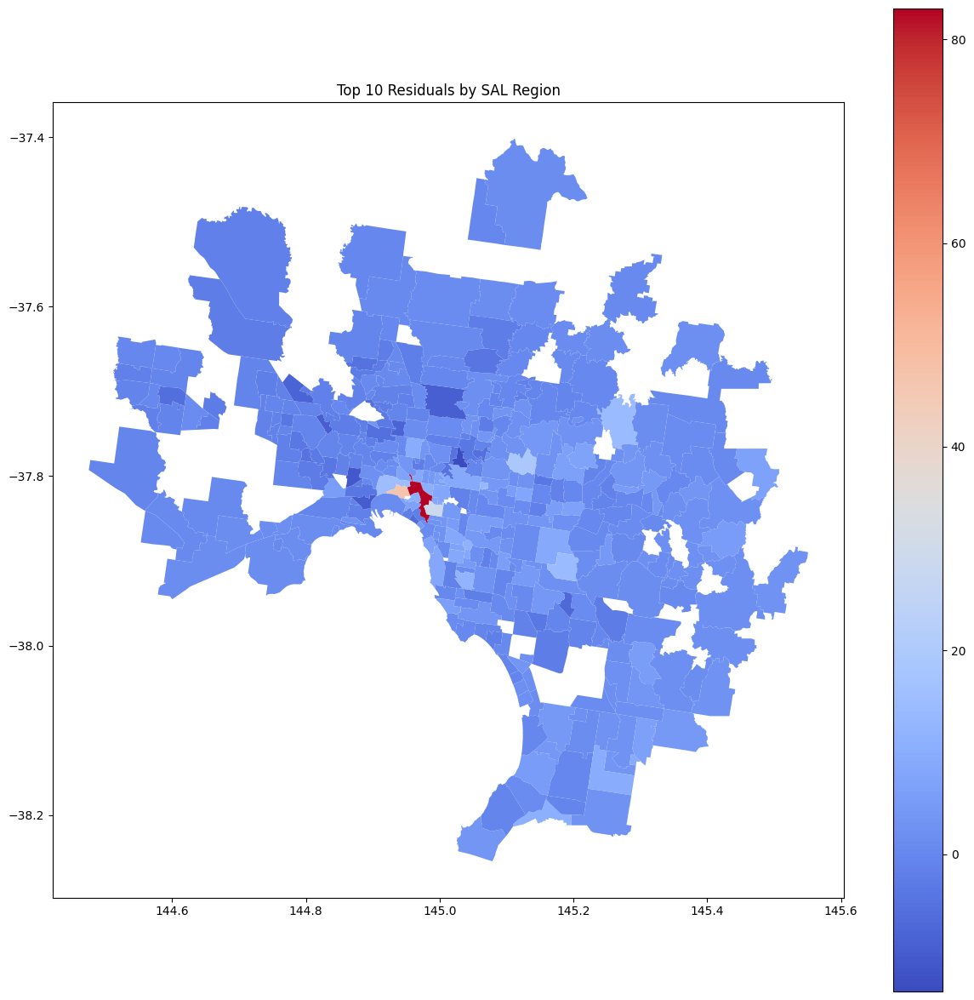

In [128]:
# graph top 10 residuals
fig, ax = plt.subplots(figsize=(15, 15))
residuals_2023.plot(column='residuals', ax=ax, legend=True, cmap='coolwarm')
plt.title('Top 10 Residuals by SAL Region')
plt.show()

In [129]:
# suburbs -> SA2

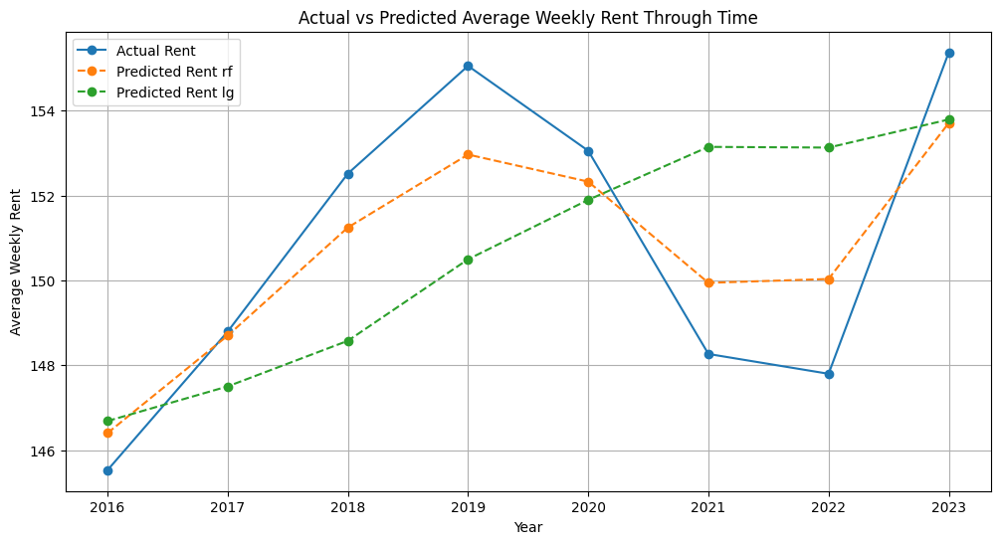

1200

In [130]:
# Calculate the predicted values by subtracting residuals from actual values
residuals_df['predicted_rent'] = residuals_df['average_weekly_rent'] - residuals_df['residuals']
residuals_df['predicted_rent_lg'] = residuals_df['average_weekly_rent'] - residuals_df['resduals_lg']

# Group by year and calculate the mean for actual and predicted rents
mean_rents = residuals_df.groupby('year')[['average_weekly_rent', 'predicted_rent','predicted_rent_lg']].mean().reset_index()

# Plot the actual vs predicted rents through time
plt.figure(figsize=(12, 6))
plt.plot(mean_rents['year'], mean_rents['average_weekly_rent'], marker='o', label='Actual Rent')
plt.plot(mean_rents['year'], mean_rents['predicted_rent'], marker='o', label='Predicted Rent rf', linestyle='--')
plt.plot(mean_rents['year'], mean_rents['predicted_rent_lg'], marker='o', label='Predicted Rent lg', linestyle='--')
plt.title('Actual vs Predicted Average Weekly Rent Through Time')
plt.xlabel('Year')
plt.ylabel('Average Weekly Rent')
plt.legend()
plt.grid(True)
plt.show()

150 * 8

In [131]:
# Filter the data for the years 2018 to 2023 (inclusive)
filtered_df = residuals_df[residuals_df['year'].isin(range(2016,2024))]

# Ensure the data is sorted by year within each group for accurate calculations
filtered_df = filtered_df.sort_values(by=['SAL_CODE', 'year'])

# Calculate the growth in average weekly rent over the last 5 years for each suburb
filtered_df['growth_actual'] = filtered_df.groupby('SAL_CODE')['average_weekly_rent'].transform(
    lambda x: (x.iloc[-1] - x.iloc[0]) / x.iloc[0] * 100 if len(x) > 1 else 0
)
filtered_df['growth_predicted'] = filtered_df.groupby('SAL_CODE')['predicted_rent'].transform(
    lambda x: (x.iloc[-1] - x.iloc[0]) / x.iloc[0] * 100 if len(x) > 1 else 0
)

# Drop duplicates to get one entry per suburb
suburb_growth_actual = filtered_df.drop_duplicates(subset='SAL_CODE', keep='last')
suburb_growth_predicted = filtered_df.drop_duplicates(subset='SAL_CODE', keep='last')

# Sort the suburbs by the highest growth in actual and predicted rents
highest_growth_actual = suburb_growth_actual.sort_values(by='growth_actual', ascending=False)
highest_growth_predicted = suburb_growth_predicted.sort_values(by='growth_predicted', ascending=False)

# Display the top suburbs with the highest growth
print("Suburbs with the highest growth in actual average weekly rent over the last 5 years:")
print(highest_growth_actual[['SAL_NAME21', 'growth_actual']])

print("\nSuburbs with the highest growth in predicted average weekly rent over the last 5 years:")
print(highest_growth_predicted[['SAL_NAME21', 'growth_predicted']])


Suburbs with the highest growth in actual average weekly rent over the last 5 years:
          SAL_NAME21  growth_actual
519        Melbourne      31.301935
679           Baxter      29.112168
2703  Caulfield East      26.945128
1575        Kallista      26.122846
927        Kingsbury      24.233934
...              ...            ...
2271  Thornhill Park     -15.586545
2207    Strathtulloh     -19.010441
2279      Weir Views     -22.177631
1935      Cobblebank     -25.106430
1815         Aintree     -33.492429

[363 rows x 2 columns]

Suburbs with the highest growth in predicted average weekly rent over the last 5 years:
            SAL_NAME21  growth_predicted
927          Kingsbury         23.412780
1575          Kallista         23.292196
967          Mill Park         21.251440
2631  Beaumaris (Vic.)         20.457972
679             Baxter         18.983819
...                ...               ...
2271    Thornhill Park        -15.738662
2279        Weir Views        -24.467221
1

In [132]:
highest_growth_predicted[highest_growth_predicted["SAL_NAME21"] == 'Melbourne']

,SAL_CODE,year,residuals,resduals_lg,average_weekly_rent,SAL_CODE21,SAL_NAME21,STE_CODE21,STE_NAME21,AUS_CODE21,...,AREASQKM21,LOCI_URI21,SHAPE_Leng,SHAPE_Area,geometry,distance_to_CBD,predicted_rent,predicted_rent_lg,growth_actual,growth_predicted
519,21640,2023,83.020265,55.551761,299.739116,21640,Melbourne,2,Victoria,AUS,...,6.5866,http://linked.data.gov.au/dataset/asgsed3/SAL/...,0.21602,0.000674,"POLYGON ((144.96885 -37.80728, 144.97094 -37.8...",1.458285,216.718851,244.187355,31.301935,-8.094266


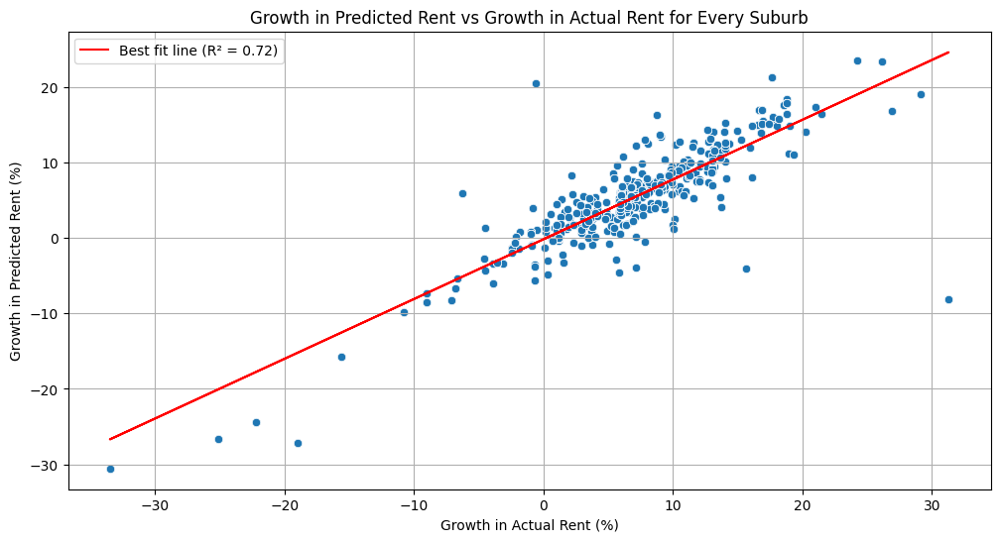

In [133]:
from scipy.stats import linregress

# Scatter plot of growth in predicted rent vs growth in actual rent for every suburb
plt.figure(figsize=(12, 6))
sns.scatterplot(x='growth_actual', y='growth_predicted', data=filtered_df)

# Calculate the line of best fit
slope, intercept, r_value, p_value, std_err = linregress(filtered_df['growth_actual'], filtered_df['growth_predicted'])
line = slope * filtered_df['growth_actual'] + intercept

# Plot the line of best fit
plt.plot(filtered_df['growth_actual'], line, color='red', label=f'Best fit line (R² = {r_value**2:.2f})')

plt.title('Growth in Predicted Rent vs Growth in Actual Rent for Every Suburb')
plt.xlabel('Growth in Actual Rent (%)')
plt.ylabel('Growth in Predicted Rent (%)')
plt.legend()
plt.grid(True)
plt.show()

In [134]:
# compare actual and predicted rents for lg rf 
# Calculate the predicted values by subtracting residuals from actual values
residuals_df['predicted_rent'] = residuals_df['average_weekly_rent'] - residuals_df['residuals']

In [135]:
# find SAL code of 10 highest residuals
top_10_residuals = residuals_df.nlargest(10, 'residuals')[['SAL_CODE21', 'SAL_NAME21', 'residuals', 'year']]
print(top_10_residuals)

      SAL_CODE21        SAL_NAME21  residuals  year
519        21640         Melbourne  83.020265  2023
463        20766         Docklands  47.175243  2023
468        20830    East Melbourne  34.498422  2020
2624       20182  Beaumaris (Vic.)  34.395234  2016
599        22314       South Yarra  28.440821  2023
402        20066   Armadale (Vic.)  27.230462  2018
467        20830    East Melbourne  26.360074  2019
151        20771         Doncaster  19.096149  2023
627        22345     St Kilda West  18.924982  2019
595        22314       South Yarra  16.599038  2019


In [136]:
# bottom 10 residuals
bottom_10_residuals = residuals_df.nsmallest(10, 'residuals')[['SAL_CODE21', 'SAL_NAME21', 'residuals', 'year']]
print(bottom_10_residuals)


      SAL_CODE21          SAL_NAME21  residuals  year
605        22315           Southbank -27.153929  2021
461        20766           Docklands -22.868633  2021
198        21152     Hawthorn (Vic.) -22.541229  2022
206        21153       Hawthorn East -20.529767  2022
662        22805      Windsor (Vic.) -18.922825  2022
614        22343     St Kilda (Vic.) -17.179587  2022
606        22315           Southbank -16.960080  2022
2022       21312              Kealba -16.853584  2022
398        20018  Albert Park (Vic.) -15.069757  2022
1160       20082             Attwood -15.022020  2016


In [137]:
import folium
from folium import Choropleth

# Convert GeoDataFrame to GeoJSON
geojson_data = residuals_2023.to_json()

# Create a base map
m = folium.Map(location=[residuals_2023.geometry.centroid.y.mean(),
                         residuals_2023.geometry.centroid.x.mean()],
               zoom_start=10)

# Add the choropleth layer
Choropleth(
    geo_data=geojson_data,
    name='choropleth',
    data=residuals_2023,
    columns=['SAL_NAME21', 'average_weekly_rent'],
    key_on='feature.properties.SAL_NAME21',
    fill_opacity=0.7,
    line_opacity=0.2,
    line_weight=0.3,  # Make lines thinner
    line_color='black',  # Change line color to black
    legend_name='Average Weekly Rent'
).add_to(m)

# Add hover functionality for each SAL region
folium.GeoJson(
    geojson_data,
    tooltip=folium.GeoJsonTooltip(fields=['SAL_NAME21', 'average_weekly_rent'],
                                  aliases=['Suburb:', 'Average Weekly Rent:'],
                                  localize=True)
).add_to(m)

# Display the map
m


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_48676/3673129997.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[residuals_2023.geometry.centroid.y.mean(),
/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_48676/3673129997.py:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  residuals_2023.geometry.centroid.x.mean()],


In [138]:
# find SAL code of 10 highest residuals
top_10_residuals = residuals_2023.nlargest(30, 'average_weekly_rent')[['SAL_NAME21', 'average_weekly_rent', 'year']]
print(top_10_residuals)

              SAL_NAME21  average_weekly_rent  year
519            Melbourne           299.739116  2023
463            Docklands           285.496193  2023
607            Southbank           274.809170  2023
471       East Melbourne           260.496193  2023
2671     Brighton (Vic.)           260.020711  2023
599          South Yarra           256.764472  2023
551       Port Melbourne           254.307534  2023
487       Fitzroy (Vic.)           249.337912  2023
591      South Melbourne           247.574498  2023
2679       Brighton East           246.327666  2023
423       Carlton (Vic.)           243.893138  2023
631        St Kilda West           243.423070  2023
455      Cremorne (Vic.)           241.626430  2023
575      Richmond (Vic.)           241.626430  2023
391    Abbotsford (Vic.)           241.389154  2023
567         Princes Hill           239.779483  2023
655       West Melbourne           238.322335  2023
447   Collingwood (Vic.)           236.197989  2023
559         

In [139]:
sal_to_exclude = pd.read_csv('../data/landing/filtered_sal_codes.csv')
